In [15]:
function compute(dx)
  # generate initial array
    stop = 100
    # dx = 0.5
    x = 0 # initial x val
    y = zeros(Float64, 0)
    i = 0

    while x < stop
        push!(y, x^42) # CHANGE THIS LINE TO CHANGE THE SHAPE OF THE GRAPH
        x += dx
    end

    # compute LRAM and RRAM
    LRAM = zeros(Float64, 0)
    RRAM = zeros(Float64, 0)

    for i in 1:length(y)-1
        val = y[i] * dx
        push!(LRAM, val)
    end

    length(LRAM)

    for i in 2:length(y)
        val = y[i] * dx
        push!(RRAM, val)
        # count +=1
    end

    # find the difference of LRAM and RRAM
    error = zeros(Float64,0)

    for i in 1:length(y)-1
        push!(error, RRAM[i] - LRAM[i])
    end  


    total = 0
    for i in 1:length(error)
        total += error[i]
    end
    averageerror = total/length(error)

    return averageerror
end


compute (generic function with 1 method)

 10.391528 seconds (5.32 M allocations: 13.713 GiB, 9.74% gc time, 0.32% compilation time)


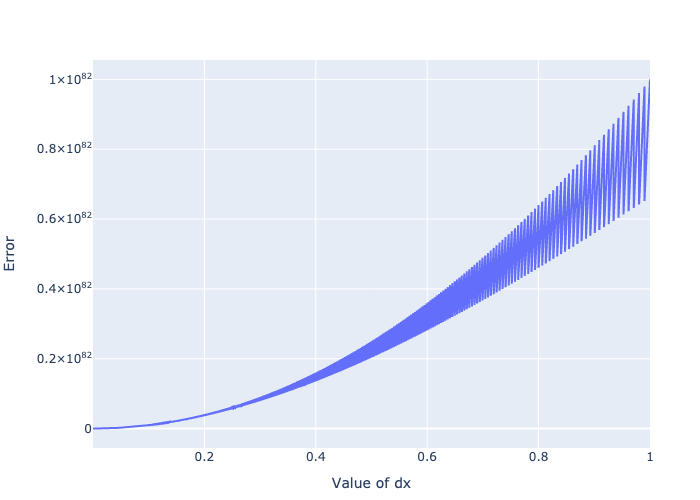

In [16]:
using PlotlyJS


# DO NOT USE START VALUES OF <= 0
start = 0.0001
stop = 1
step = 0.00001
count = 2 # initial count

dx = zeros(Float64, 0)
push!(dx, start)
push!(dx, start + step)

error = zeros(Float64, 0)

@time while dx[count] < stop
    push!(error, compute(dx[count]))
    push!(dx, dx[count - 1] + step)
    count += 1
end

layout = Layout(xaxis_title="Value of dx", yaxis_title="Error")

plot(dx, error, layout)